# COMP30850- Assignment 2 - Rugby Union Tweets
<b>By Brian Byrne - 18391933</b>
The goal of this assignment is to construct and characterise 5 different network representations of 3 related datasets, based on a topic of my choice. The topic I have slected for this notebook was rugby union as I am an avid fan. The datasets were retrieved from an online zip file <i>http://mlg.ucd.ie/modules/COMP30850/assignment2.html</i>

This notebook is divided into <b>5</b> different network representations:
### 1. Follower network
### 2. Reply network
### 3. Mention network
### 4. User-hashtag network
### 5. Hashtag co-occurrence network


In [856]:
# Importing of relevant packagages 
import networkx as nx
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import json
%matplotlib inline
import operator

## 1. Follower network
Each node in the network should represents a user from the user list

In [857]:
# Reading in the Irish CSV as a timeseries dataframe
followerDataframe = pd.read_csv("friendships.csv", sep='\t', header = None)
followerDataframe.head(10)

,0,1
0,bristolbears,asmofficiel
1,asmofficiel,bristolbears
2,championscup,asmofficiel
3,asmofficiel,championscup
4,englandrugby,asmofficiel
5,exeterchiefs,asmofficiel
6,francerugby,asmofficiel
7,asmofficiel,francerugby
8,harlequins,asmofficiel
9,asmofficiel,harlequins


In [858]:
# Directed Network to represent the Follower network  
g1 = nx.DiGraph()
for index, row in followerDataframe.iterrows():
    g1.add_edge(row[0],row[1])

In [859]:
# Functions for displaying data and graphs of our networks
# Function to print edges 
def showEdges(graph):
    for edge in graph.edges(data=True):
        print(edge)

# Function to print nodes 
def showNodes(graph):
    for node in graph.nodes(data=True):
        print(node)
        
#function to draw our existing graph
def drawGraph(graph):
    plt.figure(figsize=(8,9))
    nx.draw_shell(graph, with_labels=True, node_size=700, node_color="cyan",font_color="red",edge_color="gold" )
    plt.axis("off")
    plt.show()
    
# Function that prints the dimensions of the graph
def networkSizes(graph):
    print("Number of nodes:",graph.number_of_nodes())
    print("Number of edges:",graph.number_of_edges())

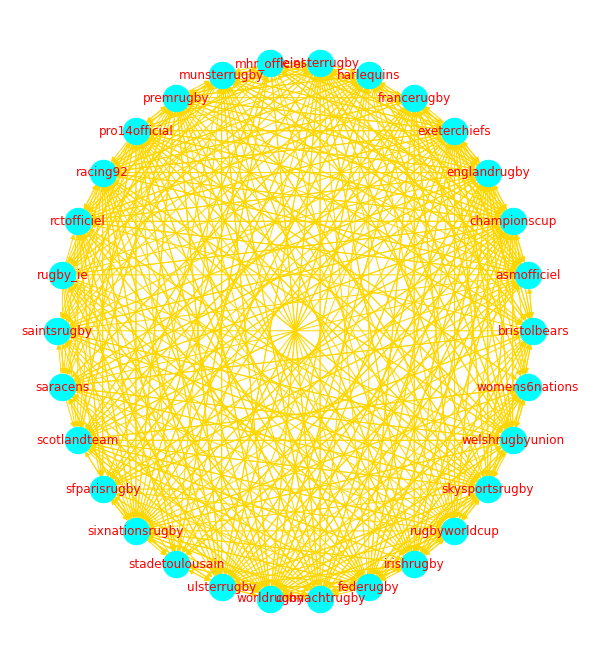

Number of nodes: 30
Number of edges: 586


In [860]:
## displaying the newly formed functions.
drawGraph(g1)
networkSizes(g1)

Each node in the network represents a twitter account affiliated with rugby union, a popular professional team sport. On closer inspection you can see small arrows in the graph, where the receiving node is being pointed to by the edge, and the other relevant node is the user who is following the receiving node. This is a complex visualization as most users have symbiotic relationships with the other twitter users. This is more or less due to the fact most of these accounts are the accounts of professional European teams that compete regularly against each other.

In [861]:
#Node Degrees- function that creates a dataframe of each node and the degrees
def degrees_df(graph):
    degrees = dict( graph.degree() )
    return pd.Series(degrees)

# Prints the degree range, mean number of degrees and median degrees of each dataframe 
def degreeData(df):
    print('Degree range: [%d, %d]' % (df.min(), df.max() ) )
    print('Mean degree: %.2f' % df.mean() )
    print('Median degree: %d' % df.median() )
    
def deghistogram(df,heading):          #displays histogram of dataframe
    ax = df.plot.hist(figsize=(11,6), fontsize=14, legend=None, color="steelblue")
    ax.set_title(heading,fontsize=30, color="k")
    ax.set_ylabel("Number of nodes", fontsize=14)
    ax.set_xlabel("Degree of node", fontsize=14);
    ax.yaxis.grid()
    ax.xaxis.grid()
    
def inDegistogram(df):          #displays histogram of dataframe- innodes
    ax = df.plot.hist(figsize=(11,6), fontsize=14, legend=None, color="steelblue")
    ax.set_title("In-Degree Distribution",fontsize=30, color="k")
    ax.set_ylabel("Number of Nodes", fontsize=14)
    ax.set_xlabel("Unweighted In-Degree", fontsize=14);
    ax.yaxis.grid()
    ax.xaxis.grid()
    
def outDegistogram(df):          #displays histogram of dataframe- outnodes
    ax = df.plot.hist(figsize=(11,6), fontsize=14, legend=None, color="#F07E14")
    ax.set_title("Out-Degree Distribution",fontsize=30, color="k")
    ax.set_ylabel("Number of Nodes", fontsize=14)
    ax.set_xlabel("Unweighted Out-Degree", fontsize=14);
    ax.yaxis.grid()
    ax.xaxis.grid()

In [862]:
##Charachterising functions##
        
def networkDensity(graph,name): #Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.
    n=graph.number_of_nodes()
    potential_edges=(n*(n-1))/2
    density=graph.number_of_edges()/potential_edges
    print(name,"has a network density of",round(density*100,2),"%")
    
def networkDiameter(graph): #the longest shortest path in the entire network
    return nx.diameter(graph)

def meanCluster(graph,name): #calculates the average cluster coefficient of a graph
    print("The nodes in",name,"have and average clustering coefficient of",round(nx.average_clustering(graph),2))

def centralityData(graph):  #Creates a dataframe of the centrality mesasures of a graph
    deg = nx.degree_centrality(graph)
    bet = nx.betweenness_centrality(graph, weight="weight")
    eig = nx.eigenvector_centrality(graph, weight="weight")
    close = nx.closeness_centrality(graph)
    s = pd.Series(deg)
    df = pd.DataFrame(s,columns=["degree_centrality"])
    df["weighted betweenness"] = pd.Series(bet)
    df["closeness"] = pd.Series(close)
    df["weighted eigenvector"] = pd.Series(eig)
    return df.sort_values(by="degree_centrality",ascending=False)

In [863]:
## Ranking each node by degree ##
accounts_by_degree=degrees_df(g1)
degreeData(accounts_by_degree)
accounts_by_degree.sort_values(ascending=False).head(10)

Degree range: [25, 56]
Mean degree: 39.07
Median degree: 39


championscup       56
worldrugby         50
englandrugby       50
sixnationsrugby    49
exeterchiefs       47
skysportsrugby     44
federugby          44
pro14official      44
racing92           44
ulsterrugby        43
dtype: int64

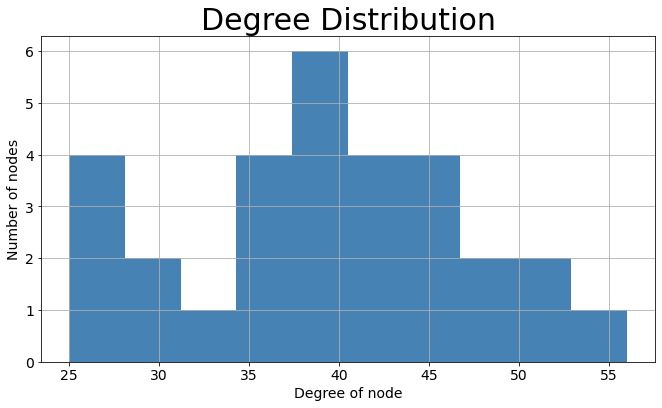

In [864]:
deghistogram(accounts_by_degree,"Degree Distribution")

In [865]:
#printing stats of th networks
networkDensity(g1,"g1")
print("Network Diameter:",networkDiameter(g1))
meanCluster(g1,"g1")

g1 has a network density of 134.71 %
Network Diameter: 2
The nodes in g1 have and average clustering coefficient of 0.73


As the minimum degree of a user is 25 in a graph of 30 nodes, we know that this is a well-connected graph, with the mean number of teams having 39 neighbouring nodes. This results in a very dense graph of 134.71% as it is a bidirectional graph. This informs us that most users are followed back by the accounts they follow. Looking at the most central nodes, we can see that the competition accounts like <b><i> championscup, worldrugby</i> and <i>sixnationsrugby</i></b> make up the nodes with the most degrees, mainly due to the fact these accounts act as umbrella or unifying accounts for a large number of users in the network. The distribution of degrees histogram displays a quite normal distribution, as these teams seem to be following eachother.This is reinforced byt the high clustering coefficient.

## A closer analysis: championscup ego-network
Below is an analysis of the most central <b><i>"championscup"</i></b> node:

In [866]:
##Egocentric graphs statistics##
def egoStats(eg):
    networkSizes(eg)
    showNodes(eg)

def display_ego(g, ego_node):#displays ego network graph
    # build the ego network
    eg = nx.ego_graph(g, ego_node)
    # create the figure
    plt.figure(figsize=(20,25))
    plt.margins(0.1, 0.1)
    title = "Ego network for %s (%d nodes)" % (ego_node, eg.number_of_nodes())
    plt.title(title, fontsize=14)
    # lay out all nodes
    pos = nx.spring_layout(g)
    # draw the full network
    nx.draw_networkx(eg, pos, with_labels=True, font_size=12, node_size=900, node_color="paleturquoise", font_color="red",edge_color="gold")
    # draw the ego in red, with larger node size
    nx.draw_networkx_nodes(eg, pos, nodelist=[ego_node], node_size=2500, node_color="darkorange")
    plt.axis("off")
    
def barChart(df, header):# displays a barchart for distribution
    p = df.plot.bar(figsize=(19, 10), fontsize=14)
    p.set_title(header, fontsize=35, color="k")
    plt.xticks(rotation=45, fontsize=14)
    p.set_ylabel("Number of Neigbouring Nodes", fontsize=24,color="k")



In [867]:
g1_ego_node="championscup"

In [868]:
eg1 = nx.ego_graph(g1, g1_ego_node)

In [869]:
print(" _________\n|eg1 stats|\n|_________|")
egoStats(eg1)

 _________
|eg1 stats|
|_________|
Number of nodes: 30
Number of edges: 586
('bristolbears', {})
('asmofficiel', {})
('championscup', {})
('englandrugby', {})
('exeterchiefs', {})
('francerugby', {})
('harlequins', {})
('leinsterrugby', {})
('mhr_officiel', {})
('munsterrugby', {})
('premrugby', {})
('pro14official', {})
('racing92', {})
('rctofficiel', {})
('rugby_ie', {})
('saintsrugby', {})
('saracens', {})
('scotlandteam', {})
('sfparisrugby', {})
('sixnationsrugby', {})
('stadetoulousain', {})
('ulsterrugby', {})
('worldrugby', {})
('connachtrugby', {})
('federugby', {})
('irishrugby', {})
('rugbyworldcup', {})
('skysportsrugby', {})
('welshrugbyunion', {})
('womens6nations', {})


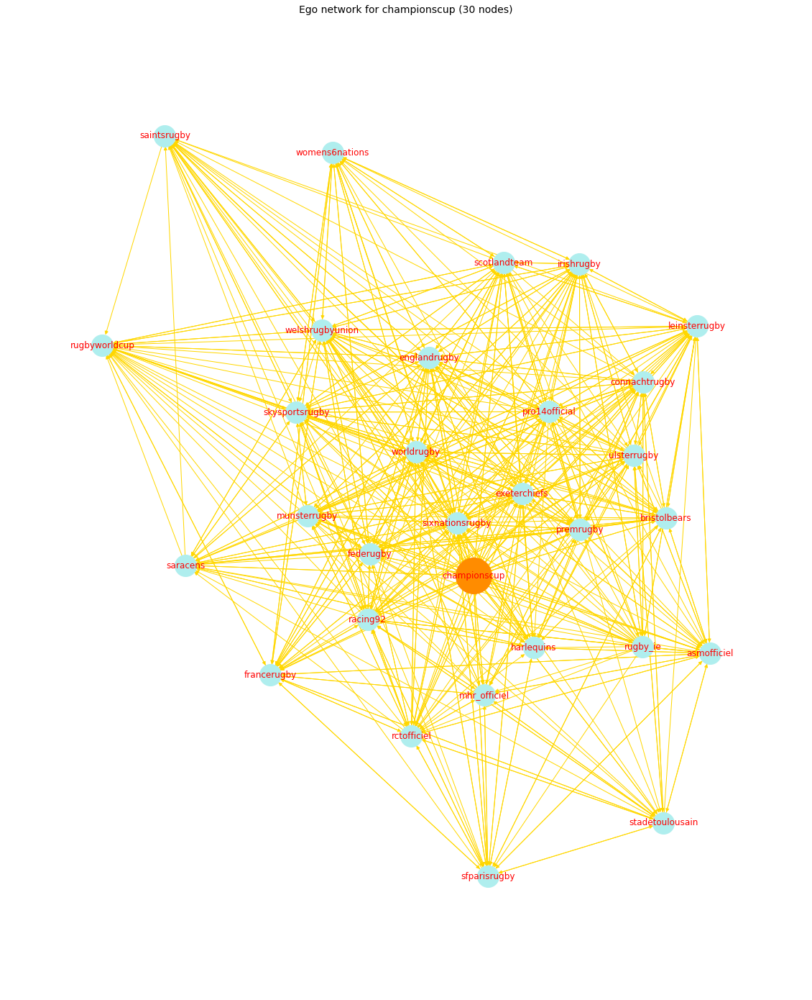

In [870]:
display_ego(g1, "championscup")

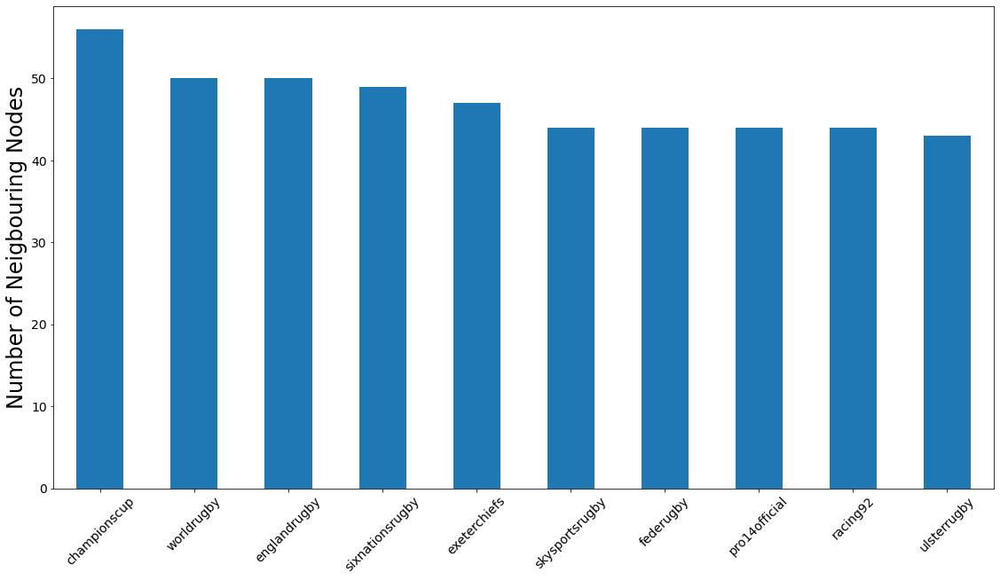

In [871]:
barChart(accounts_by_degree.sort_values(ascending=False).head(10), "")

The ego-network <b><i>eg1</i></b> shows the importance of the <i> championscup </i> account in the network. We can see that the ego-network is the same size as the original network. We can see from this insight that <i> championscup </i> is a follower and/or is followed by every other node in the original network.

## In Degree
Bidirectional graphs are a little more complex than traditional graphs. The in-degree represents the number of followers of each user in the network.

In [872]:
# get a dictionary of in-degree scores for all nodes
in_deg = dict(g1.in_degree())
indeg.sort_values(ascending=False).head(10)

championscup       27
rugbyworldcup      26
worldrugby         26
englandrugby       25
sixnationsrugby    24
skysportsrugby     23
irishrugby         22
welshrugbyunion    22
leinsterrugby      22
scotlandteam       22
dtype: int64

In [873]:
#indegree stats
indeg = pd.Series(in_degrees)
print('In-degree range: [%d, %d]' % (indeg.min(), indeg.max() ) )
print('Mean in-degree: %.2f' % indeg.mean() )
print('Median in-degree: %d' % indeg.median() )

In-degree range: [7, 27]
Mean in-degree: 19.53
Median in-degree: 19


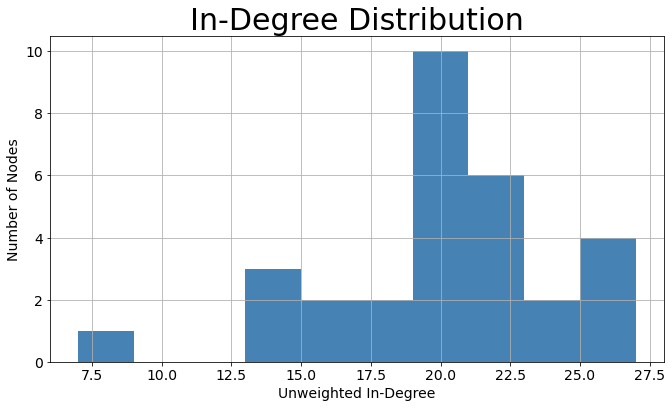

In [874]:
inDegistogram(indeg)

In [875]:
indeg.sort_values(ascending=False).tail(1)

rugby_ie    7
dtype: int64

Most user nodes are being followed by 15 plus other nodes in the network. We can however see an obvious outlier with 7 followers in the network. This is <i> rugby_ie </i> also known as the 42, an Irish Rugby news account that is not directly involved with the majority of the other accounts which appear to be rugby teams and rugby organisations.

## Out Degree
The out-degree represents the number of other users in the network that a node is following.

In [876]:
# get a dictionary of out-degree scores for all nodes
out_deg = dict(g1.out_degree())
outdeg.sort_values(ascending=False).head(10)

championscup       29
exeterchiefs       28
pro14official      26
racing92           25
englandrugby       25
federugby          25
sixnationsrugby    25
rugby_ie           24
premrugby          24
worldrugby         24
dtype: int64

In [877]:
#out degree stats
outdeg = pd.Series(out_degrees)
print('Out-degree range: [%d, %d]' % (outdeg.min(), outdeg.max() ) )
print('Mean out-degree: %.2f' % outdeg.mean() )
print('Median out-degree: %d' % outdeg.median() )

Out-degree range: [7, 29]
Mean out-degree: 19.53
Median out-degree: 20


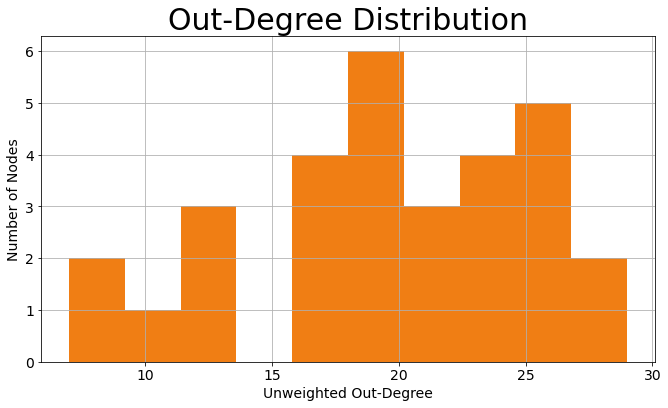

In [878]:
outDegistogram(outdeg)

In [879]:
out_deg

{'bristolbears': 22,
 'asmofficiel': 16,
 'championscup': 29,
 'englandrugby': 25,
 'exeterchiefs': 28,
 'francerugby': 16,
 'harlequins': 18,
 'leinsterrugby': 20,
 'mhr_officiel': 18,
 'munsterrugby': 17,
 'premrugby': 24,
 'pro14official': 26,
 'racing92': 25,
 'rctofficiel': 20,
 'rugby_ie': 24,
 'saintsrugby': 7,
 'saracens': 13,
 'scotlandteam': 17,
 'sfparisrugby': 13,
 'sixnationsrugby': 25,
 'stadetoulousain': 12,
 'ulsterrugby': 23,
 'worldrugby': 24,
 'connachtrugby': 20,
 'federugby': 25,
 'irishrugby': 18,
 'rugbyworldcup': 9,
 'skysportsrugby': 21,
 'welshrugbyunion': 21,
 'womens6nations': 10}

In [880]:
#function that gathers the centrality data of graph
g1_measurements=centralityData(g1).head(10)
g1_measurements

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
championscup,1.931034,0.039392,0.935484,0.239324
worldrugby,1.724138,0.019878,0.906250,0.238287
englandrugby,1.724138,0.021751,0.878788,0.229365
sixnationsrugby,1.689655,0.020016,0.852941,0.215084
exeterchiefs,1.620690,0.018416,0.743590,0.171006
federugby,1.517241,0.014730,0.743590,0.180220
pro14official,1.517241,0.012991,0.725000,0.170377
racing92,1.517241,0.012624,0.743590,0.169917
skysportsrugby,1.517241,0.017820,0.828571,0.214214
welshrugbyunion,1.482759,0.016530,0.805556,0.203277


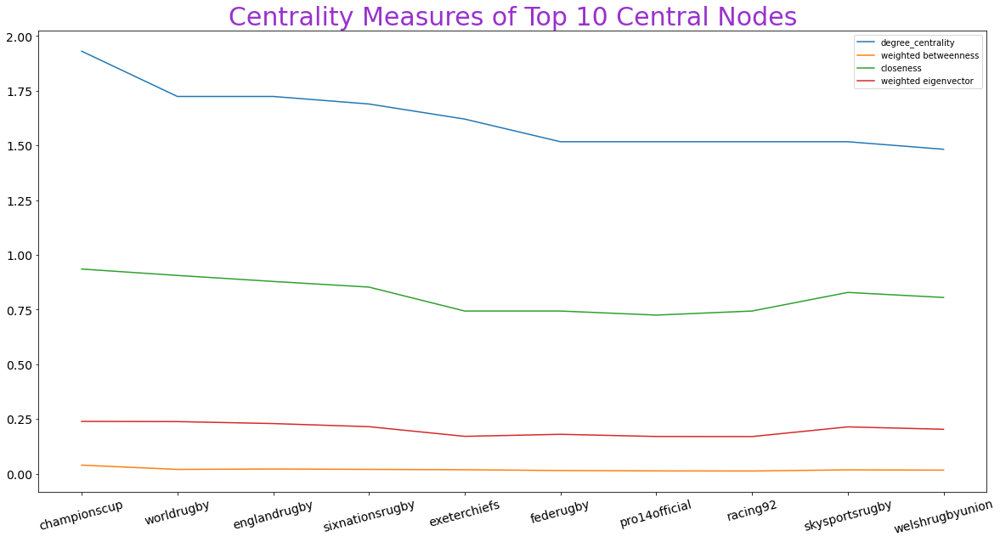

In [881]:
#Line graph using matplotlib
plt.figure(figsize=(20,10))
plt.plot(g1_measurements)
plt.title("Centrality Measures of Top 10 Central Nodes", fontsize=30, color="darkorchid")
plt.xticks(rotation=15, fontsize=14)
plt.yticks(fontsize=14)
plt.gca().legend(("degree_centrality","weighted betweenness","closeness","weighted eigenvector"))
plt.show()

In [882]:
g1_measurements.corr() #analysing the correlations of each centrality measurement

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
degree_centrality,1.000000,0.908548,0.817246,0.724292
weighted betweenness,0.908548,1.000000,0.782826,0.699644
closeness,0.817246,0.782826,1.000000,0.984553
weighted eigenvector,0.724292,0.699644,0.984553,1.000000


The out-degree stats tell us that the users appear to be following slightly more users in the network than follow them back from the network. Interestingly enough, <i> championscup </i> appears to follow every other member of the network, explaining why the original network and it’s ego-network have the same number of nodes.

From out centrality measurements and the fact that this is an unweighted graph, we can see that degree centrality is an efficient method of determining the important nodes of the networks, with  , <i> championscup </i> being the most important in <b><i>g1</i></b>


# 2. Reply network
This network consists of the users including those outside of the recognised rugby accounts from earlier, that have replied to tweets by those recognised rugby accounts.

In [883]:
# loading in the JSON Files #
tweets= []
with open("tweets.jsonl") as f:
    for line in f:
        tweets.append(json.loads(line))
        
users=[]
with open("list_members.jsonl") as f:
    for line in f:
        users.append(json.loads(line))

In [884]:
tweetsDF=pd.DataFrame(tweets)
tweetsDF.head(7)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,quoted_status_id_str,quoted_status_permalink,retweet_count,favorite_count,favorited,retweeted,lang,extended_entities,possibly_sensitive,quoted_status
0,Fri Dec 04 13:48:36 +0000 2020,1334857137336541184,1334857137336541184,RT @laliguecancer: Lors du match France - Ital...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,1334585948701650944,"{'url': 'https://t.co/pG8YAfJkbc', 'expanded':...",14,0,False,False,fr,NaN,NaN,NaN
1,Mon Jan 25 12:46:14 +0000 2021,1353685610767257600,1353685610767257600,"Malgré le report du @Womens6Nations, nos Bleue...",False,"[0, 221]","{'hashtags': [{'text': 'XVdeFrance', 'indices'...","<a href=""https://studio.twitter.com"" rel=""nofo...",NaN,None,...,NaN,NaN,8,58,False,False,fr,"{'media': [{'id': 1353684540947111936, 'id_str...",False,NaN
2,Sat Dec 19 17:27:13 +0000 2020,1340347972098400260,1340347972098400260,Chiefs TV - We speak with @ExeterChiefs Women ...,False,"[0, 197]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://studio.twitter.com"" rel=""nofo...",NaN,None,...,NaN,NaN,2,22,False,False,en,"{'media': [{'id': 1340346818794819585, 'id_str...",False,NaN
3,Wed Dec 30 16:47:34 +0000 2020,1344324257787113472,1344324257787113472,"🤔 À votre avis, qui sera élu 𝐏𝐚𝐫𝐢𝐬𝐢𝐞𝐧 𝐝𝐮 𝐦𝐨𝐢𝐬 ?",False,"[0, 47]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",1.344324e+18,1344323613156134919,...,NaN,NaN,0,4,False,False,fr,NaN,NaN,NaN
4,Sun Dec 20 20:07:42 +0000 2020,1340750745562439681,1340750745562439681,✅ #HeinekenChampionsCup win\n👜 Bonus point in ...,False,"[0, 183]","{'hashtags': [{'text': 'HeinekenChampionsCup',...","<a href=""https://ads-api.twitter.com"" rel=""nof...",NaN,None,...,NaN,NaN,0,51,False,False,en,NaN,NaN,NaN
5,Wed Dec 16 16:26:20 +0000 2020,1339245484842622976,1339245484842622976,@markismith50 https://t.co/G1NIjG4s9X,False,"[13, 13]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",1.339243e+18,1339243033548689409,...,NaN,NaN,0,2,False,False,und,"{'media': [{'id': 1339245476491776002, 'id_str...",False,NaN
6,Thu Dec 10 18:30:00 +0000 2020,1337102279766261766,1337102279766261766,Huw Jones scores 🙌 \n\nA throwback try from ou...,False,"[0, 197]","{'hashtags': [{'text': 'ThrowbackThursday', 'i...","<a href=""https://studio.twitter.com"" rel=""nofo...",NaN,None,...,NaN,NaN,17,298,False,False,en,"{'media': [{'id': 1337070456487153669, 'id_str...",False,NaN


In [885]:
bool1=pd.notnull(tweetsDF["in_reply_to_screen_name"])#names of repliers being gatheres
replies=tweetsDF[bool1]

g2=nx.DiGraph()
## algorithm to create the the bidirectional graph of repliers and repliees 
for index, row in replies.iterrows():
    if row["in_reply_to_screen_name"] != row["user"]["screen_name"]:
        g2.add_edge( row["user"]["screen_name"],row["in_reply_to_screen_name"])  

In [886]:
#function to draw our existing graph
def drawGraph2(graph):
    plt.figure(figsize=(20,20))
    nx.draw_networkx(graph, with_labels=True, node_size=700, node_color="cyan" )
    plt.axis("off")
    plt.show()

In [887]:
networkSizes(g2)

Number of nodes: 589
Number of edges: 607


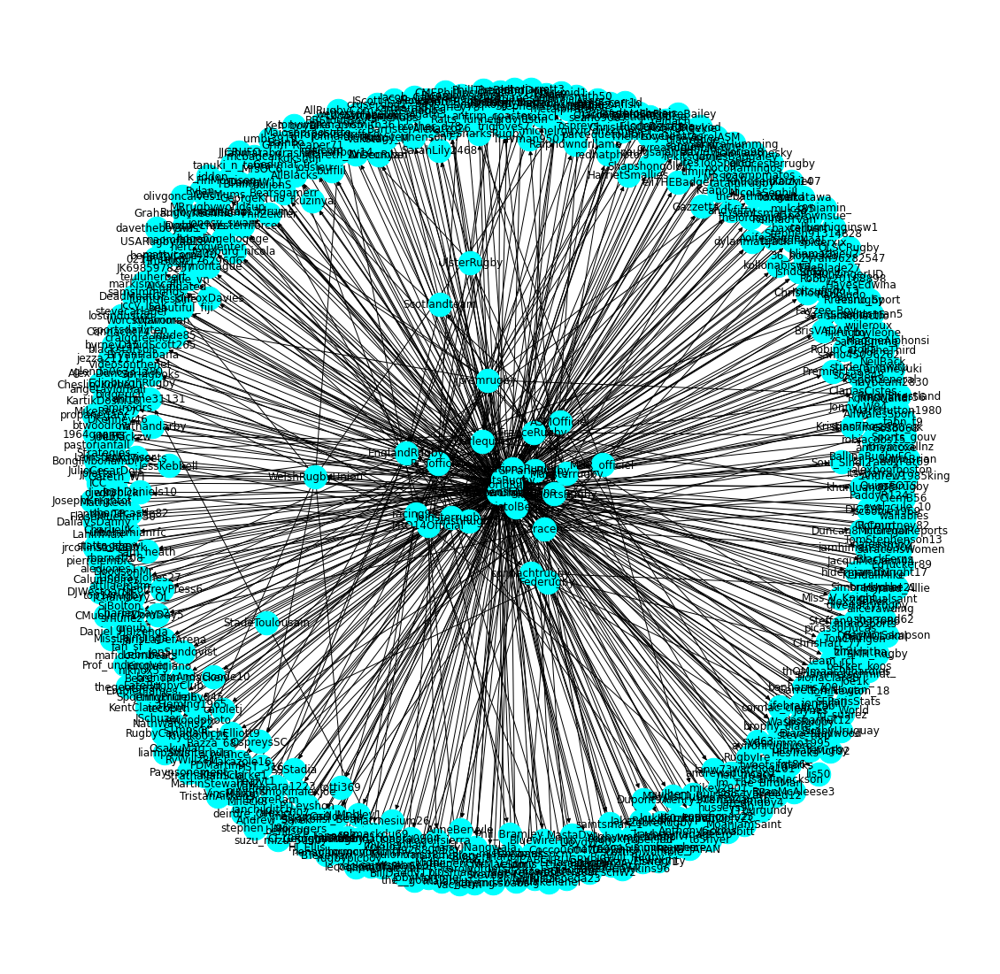

In [888]:
drawGraph2(g2)

In [889]:
replies_by_degree=degrees_df(g2)
degreeData(replies_by_degree)
replies_by_degree.sort_values(ascending=False).head(10)

Degree range: [1, 160]
Mean degree: 2.06
Median degree: 1


rugbyworldcup      160
WorldRugby         116
SaintsRugby         75
RCTofficiel         27
SixNationsRugby     23
EnglandRugby        21
Saracens            20
FranceRugby         18
Harlequins          16
SFParisRugby        15
dtype: int64

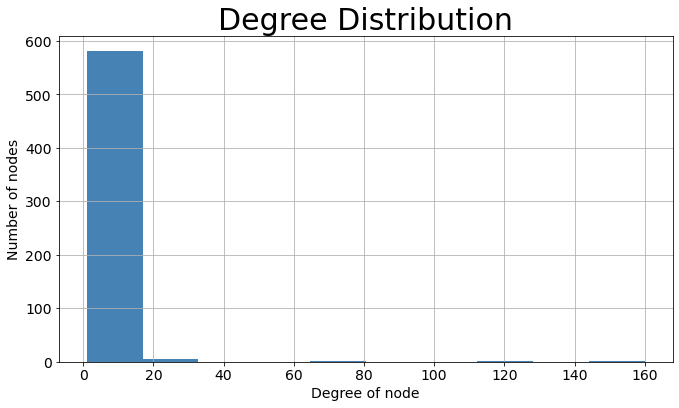

In [890]:
deghistogram(replies_by_degree,"Degree Distribution")

In [891]:
networkDensity(g2,"g2")
print(nx.is_strongly_connected(g2))
meanCluster(g2,"g2")

g2 has a network density of 0.35 %
False
The nodes in g2 have and average clustering coefficient of 0.01


The reply network is spread out and larger, however glancing at the analytics behind this network, we can quickly see that <b><i>rugbyworldcup</i></b> and <b><i>WorldRugby</i></b> stand out far beyond the other repliers with <b><i>rugbyworldcup</i></b>'s  number of replies on rugby related tweets, with over 100 times as many tweets as most of the other repliers.

## A closer analysis: Users that reply to other users
The above visualization its very deailted, so we will look closer at the users who reply to other users tweets in the network.

In [892]:
usersDF=pd.DataFrame(users)#dataframe of the users
usersDF.head(7)

,id,id_str,name,screen_name,location,description,url,entities,protected,followers_count,...,profile_sidebar_fill_color,profile_text_color,profile_use_background_image,has_extended_profile,default_profile,default_profile_image,following,follow_request_sent,notifications,translator_type
0,800676842692673537,800676842692673537,Women's Six Nations,Womens6Nations,Europe,The Women's Six Nations - played annually in F...,https://t.co/E6n3vdWLaq,{'url': {'urls': [{'url': 'https://t.co/E6n3vd...,False,14452,...,000000,000000,False,True,False,False,False,False,False,none
1,2150576953,2150576953,France Rugby,FranceRugby,"Marcoussis, France",🏉🇫🇷 Fédération Française de Rugby | #RugbyAmat...,https://t.co/Gk9vDZphZo,{'url': {'urls': [{'url': 'https://t.co/Gk9vDZ...,False,713840,...,DDEEF6,333333,True,False,False,False,False,False,False,none
2,890744342,890744342,The42.ie Rugby,rugby_ie,Ireland,"All the oval-shaped news, analysis and opinion...",https://t.co/FCrOBkIfox,{'url': {'urls': [{'url': 'https://t.co/FCrOBk...,False,20095,...,C0DFEC,333333,True,False,False,False,False,False,False,none
3,522994958,522994958,ASM Rugby,ASMOfficiel,"Clermont Ferrand, France",Compte Officiel de l'ASM Clermont Auvergne,http://t.co/SWJgo49CzD,{'url': {'urls': [{'url': 'http://t.co/SWJgo49...,False,250446,...,DDEEF6,333333,True,False,False,False,False,False,False,none
4,468326912,468326912,World Rugby,WorldRugby,Dublin,Keep up to date with all the latest rugby news...,https://t.co/YB2A7liSdl,{'url': {'urls': [{'url': 'https://t.co/YB2A7l...,False,438447,...,DDEEF6,333333,False,False,False,False,False,False,False,none
5,454903662,454903662,Stade Français Paris,SFParisRugby,"Paris, France",🏉 Rugby • 🏟 Stade Jean Bouin • 🏆 14 Boucliers ...,https://t.co/tW65OvEVZV,{'url': {'urls': [{'url': 'https://t.co/tW65Ov...,False,314572,...,DDEEF6,333333,True,False,False,False,False,False,False,regular
6,377915688,377915688,RCT - RC Toulon,RCTofficiel,Toulon,Rugby Club Toulonnais #RCTFamily #TeamRCT ⭐️⭐️⭐️,http://t.co/BPr7VRs2lP,{'url': {'urls': [{'url': 'http://t.co/BPr7VRs...,False,199306,...,181A15,CC051C,False,False,False,False,False,False,False,regular


In [893]:
userNames=list(usersDF["screen_name"])###creating a graph of users who have replied to other users

g2a=nx.DiGraph()

for index, row in replies.iterrows():
    if row["in_reply_to_screen_name"] in userNames and row["in_reply_to_screen_name"] != row["user"]["screen_name"]:
        g2a.add_edge(row["user"]["screen_name"],row["in_reply_to_screen_name"])  
            
        
networkSizes(g2a)

Number of nodes: 24
Number of edges: 34


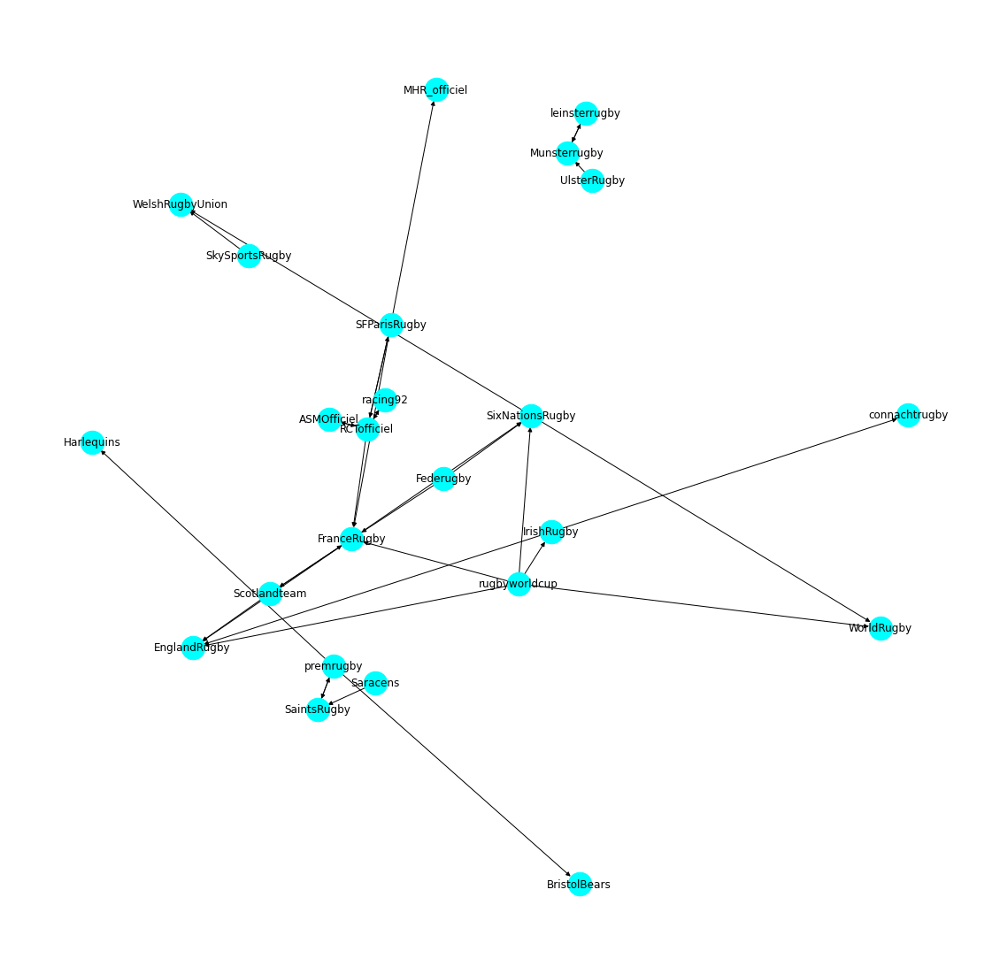

In [894]:
drawGraph2(g2a)

In [895]:
networkDensity(g2a,"g2a")

g2a has a network density of 12.32 %


In [896]:
replies_by_degree2A=degrees_df(g2a)
degreeData(replies_by_degree2A)
replies_by_degree2A.sort_values(ascending=False).head(10)

Degree range: [1, 8]
Mean degree: 2.83
Median degree: 2


FranceRugby        8
RCTofficiel        7
rugbyworldcup      5
SixNationsRugby    5
premrugby          4
EnglandRugby       4
SFParisRugby       4
Scotlandteam       3
Munsterrugby       3
SaintsRugby        3
dtype: int64

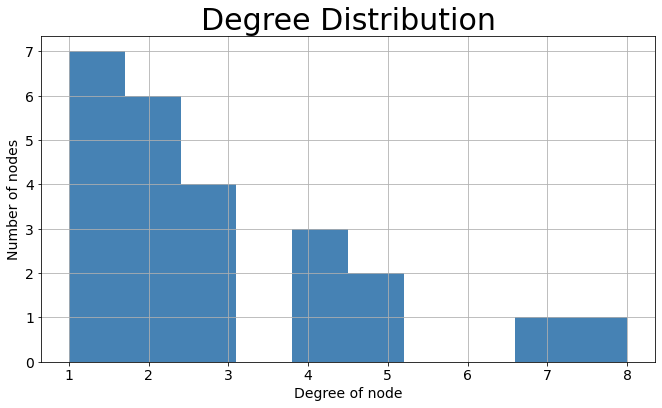

In [897]:
deghistogram(replies_by_degree2A,"Degree Distribution")

This smaller graph allows us to gain more insights about how the users interact with each other. We immediately observe how the international teams communicate with each other and their competitions, while we also see the French National team communicating with French clubs as well as their counterparts from abroad, which seems to be a key feature for why it is the most central node of this subgraph. Furthermore, we can see the English and Irish teams clustered together on their own. 

In [898]:
g2_measurements=centralityData(g2).head(10)
g2_measurements

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
rugbyworldcup,0.272109,0.000000,0.000000,1.146235e-15
WorldRugby,0.197279,0.002967,0.005989,6.618003e-02
SaintsRugby,0.127551,0.000517,0.003401,7.384565e-06
RCTofficiel,0.045918,0.001336,0.005102,1.453360e-01
SixNationsRugby,0.039116,0.002915,0.007256,1.146254e-01
EnglandRugby,0.035714,0.000443,0.008610,1.808054e-01
Saracens,0.034014,0.000000,0.000000,1.146235e-15
FranceRugby,0.030612,0.002538,0.009259,1.985352e-01
Harlequins,0.027211,0.000130,0.002551,7.384565e-06
SFParisRugby,0.025510,0.000139,0.003061,8.390979e-02


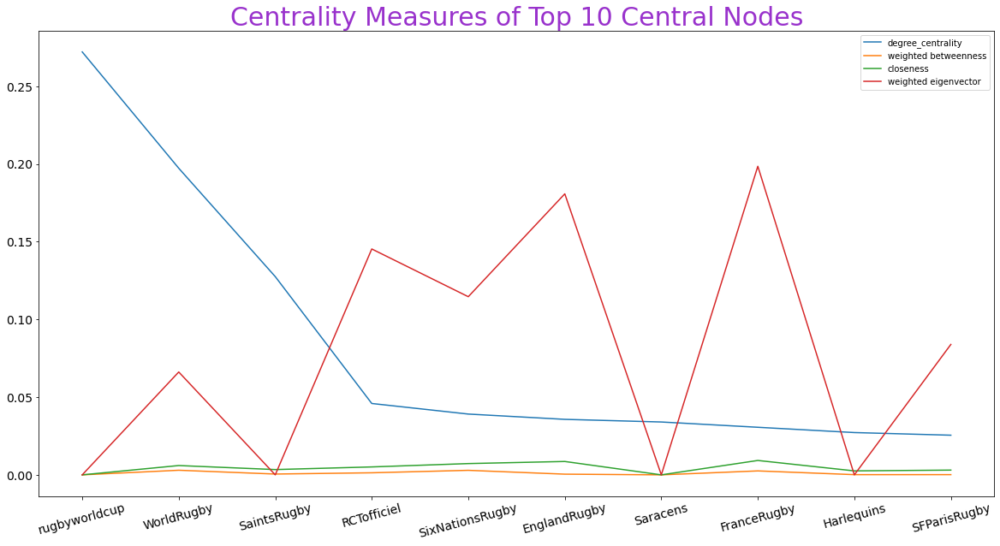

In [899]:
#Line graph using matplotlib
plt.figure(figsize=(20,10))
plt.plot(g2_measurements)
plt.title("Centrality Measures of Top 10 Central Nodes", fontsize=30, color="darkorchid")
plt.xticks(rotation=15, fontsize=14)
plt.yticks(fontsize=14)
plt.gca().legend(("degree_centrality","weighted betweenness","closeness","weighted eigenvector"))
plt.show()

In [900]:
g2_measurements.corr()

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
degree_centrality,1.000000,0.010198,-0.352070,-0.440389
weighted betweenness,0.010198,1.000000,0.702403,0.514959
closeness,-0.352070,0.702403,1.000000,0.882875
weighted eigenvector,-0.440389,0.514959,0.882875,1.000000


In terms of centrality, it appears that <b><i>EnglandRugby</i></b> and <b><i>FranceRugby</i></b> appear to frequently reply to tweets by the same accounts, but <b><i>rugbyworldcup</i></b>’s large degree quantity and significantly lower weighted eigenvector seems to tell us that they are replying to a much more diverse network of user tweets. This makes sense as they are the representative body of all professional rugby union teams worldwide, and the others are limited to just their own nation.

# 3. Mention network
This network consists of the users including those outside of the recognised rugby accounts from earlier, that have mentioned those recognised rugby accounts in tweets.

In [901]:
g3a = nx.DiGraph()
#creating a graph of users mentions in their tweets

for i, row in tweetsDF.iterrows():
    if len(row["entities"]["user_mentions"]) > 0:
        for j in range(0,len(row["entities"]["user_mentions"])):
            for k in row["entities"]["user_mentions"][j]:
                if row["user"]["screen_name"] != row["entities"]["user_mentions"][j]["screen_name"]:
                    g3a.add_edge(row["user"]["screen_name"], row["entities"]["user_mentions"][j]["screen_name"])

In [902]:
networkSizes(g3a)

Number of nodes: 2456
Number of edges: 3631


In [903]:
#function to draw our existing graph
def drawGraph3(graph):
    plt.figure(figsize=(20,20))
    nx.draw_spring(graph, with_labels=True, node_size=300, node_color="cyan",edge_color="cadetblue")
    plt.axis("off")
    plt.show()

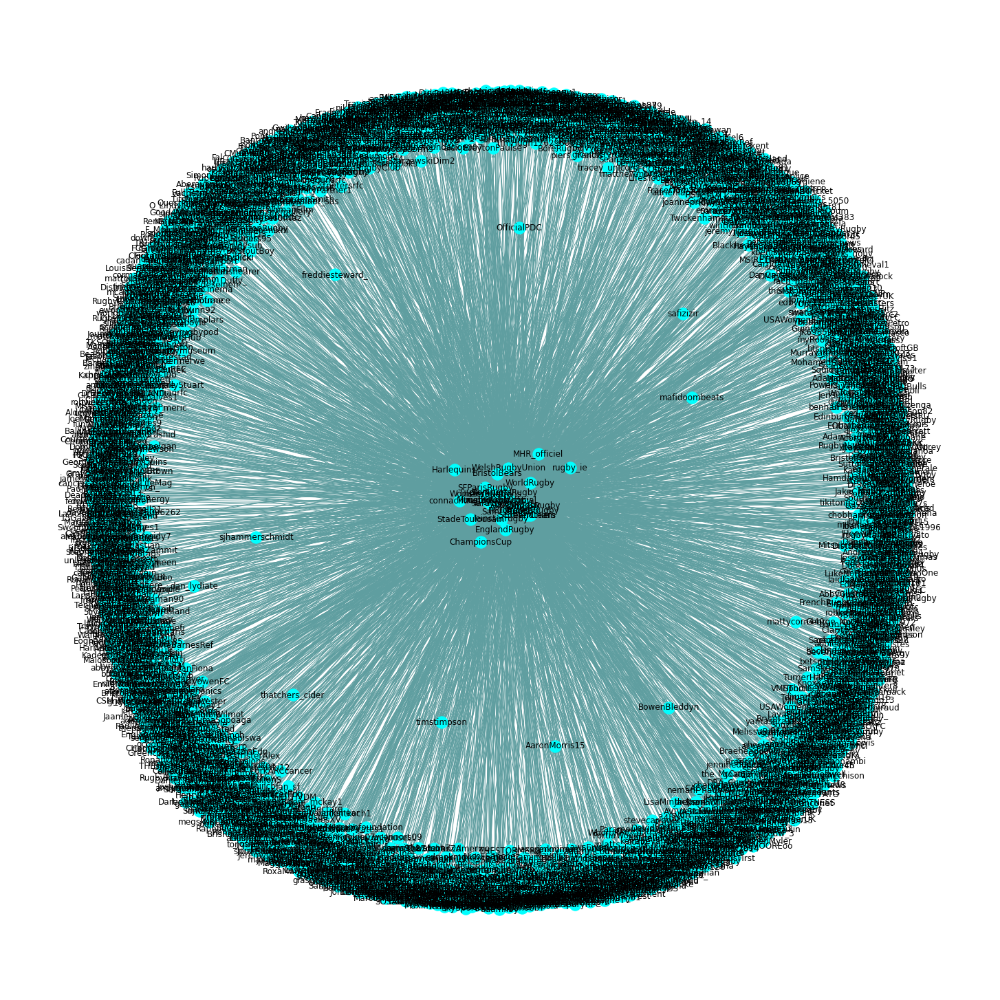

In [904]:
drawGraph3(g3a)

In [905]:
mentions_by_degree=degrees_df(g3a)
degreeData(mentions_by_degree)
mentions_by_degree.sort_values(ascending=False).head(10)

Degree range: [1, 325]
Mean degree: 2.96
Median degree: 1


WorldRugby         325
rugbyworldcup      270
WelshRugbyUnion    198
EnglandRugby       197
SaintsRugby        179
ChampionsCup       176
Saracens           170
premrugby          158
IrishRugby         149
FranceRugby        147
dtype: int64

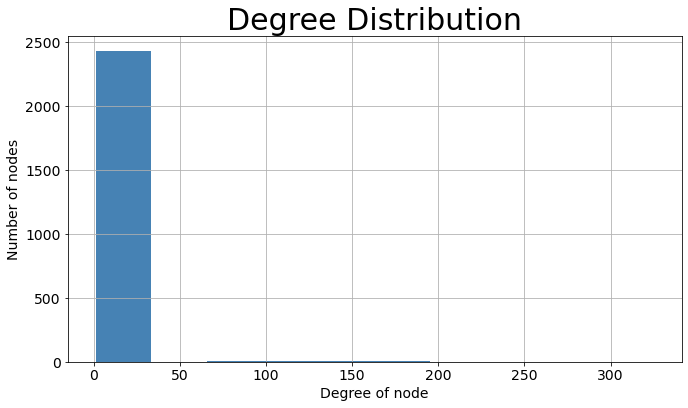

In [906]:
deghistogram(mentions_by_degree,"Degree Distribution")

In [907]:
networkDensity(g3a,"g3a")
print(nx.is_strongly_connected(g3a))
meanCluster(g3a,"g3a")


g3a has a network density of 0.12 %
False
The nodes in g3a have and average clustering coefficient of 0.14


The mention network is the largest graph. We can yet again takeaway similar patterns where <b><i>WorldRugby</i></b> and <b><i>rugbyworldcup</i></b> occur in tweets much more than the other users in the network. As a result, the network is reasonably clustered with infrequent mentions in tweets, and low density due to the diverse nature of the mention frequencies here.
## A closer analysis: Users that mention to other users


In [908]:
g3b = nx.DiGraph()###creating a graph of users who have mentioned other users

for i, row in tweetsDF.iterrows():
    if len(row["entities"]["user_mentions"]) > 0:
        for j in range(0,len(row["entities"]["user_mentions"])):
            for k in row["entities"]["user_mentions"][j]:
                if row["user"]["screen_name"] != row["entities"]["user_mentions"][j]["screen_name"] and row["entities"]["user_mentions"][j]["screen_name"] in userNames:
                    g3b.add_edge(row["user"]["screen_name"], row["entities"]["user_mentions"][j]["screen_name"])

networkSizes(g3b)

Number of nodes: 29
Number of edges: 271


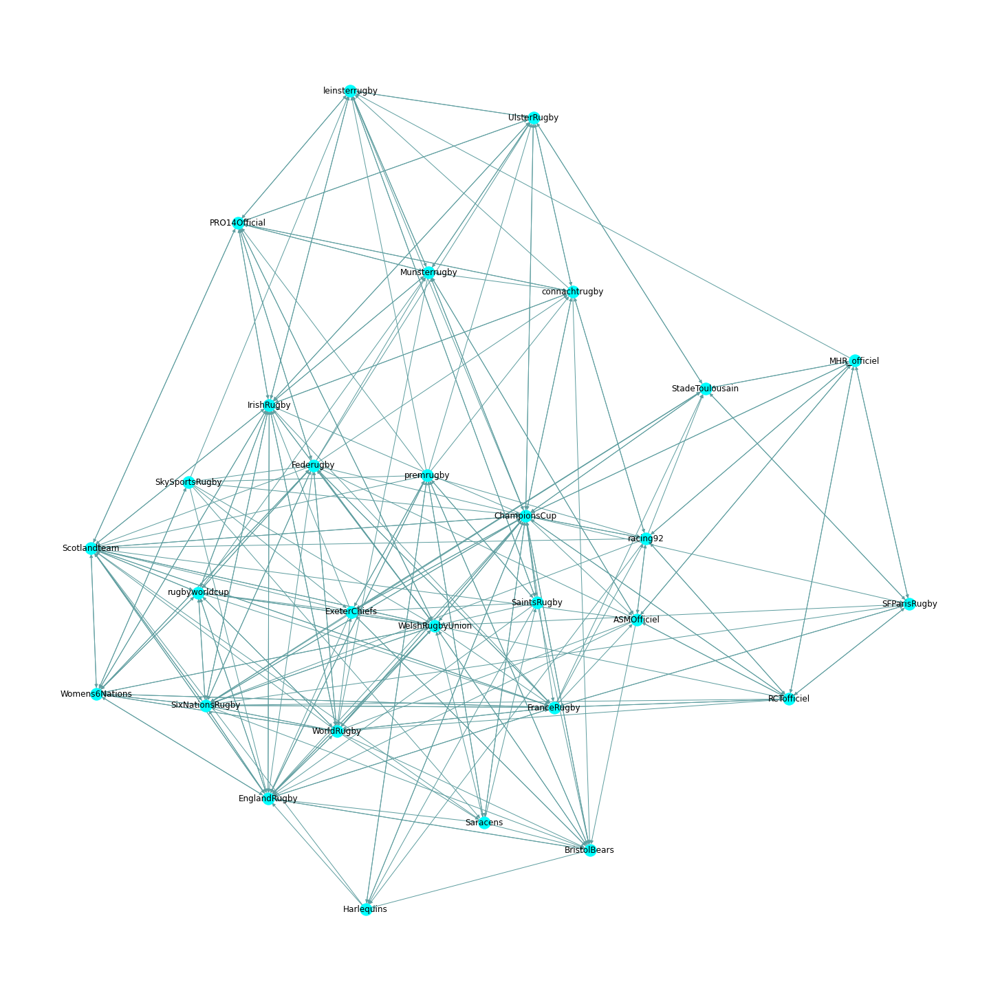

In [909]:
drawGraph3(g3b)

In [910]:
networkDensity(g3b,"g3b")

g3b has a network density of 66.75 %


In [911]:
replies_by_degree3b=degrees_df(g3b)
degreeData(replies_by_degree3b)
replies_by_degree3b.sort_values(ascending=False).head(10)

Degree range: [9, 40]
Mean degree: 18.69
Median degree: 17


ChampionsCup       40
WelshRugbyUnion    29
EnglandRugby       28
IrishRugby         27
Scotlandteam       26
SixNationsRugby    26
WorldRugby         25
FranceRugby        23
Federugby          22
Womens6Nations     20
dtype: int64

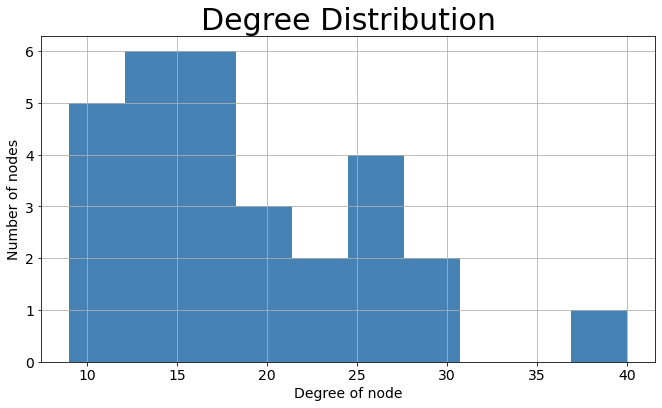

In [912]:
deghistogram(replies_by_degree3b,"Degree Distribution")

The users who mention users’ network is very dense and richly connected. Quite interesting to see that the Welsh national team has the most neighbours outside of the Champions Cup, is by far the most central node. The Irish, English, Scottish and Welsh accounts are all mentioned a very similar number of times, which could be due to the fact the annually play eachother and are mentioned in score updates etc.

In [913]:
g3_measurements=centralityData(g3a).head(10)
g3_measurements

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
WorldRugby,0.132383,0.001561,0.007258,0.138420
rugbyworldcup,0.109980,0.000912,0.006517,0.111929
WelshRugbyUnion,0.080652,0.001080,0.007789,0.149394
EnglandRugby,0.080244,0.001101,0.008404,0.165335
SaintsRugby,0.072912,0.000756,0.005603,0.026040
ChampionsCup,0.071690,0.002309,0.008404,0.132546
Saracens,0.069246,0.000621,0.005806,0.031049
premrugby,0.064358,0.000616,0.005806,0.039086
IrishRugby,0.060692,0.000921,0.007604,0.152532
FranceRugby,0.059878,0.000704,0.007258,0.146672


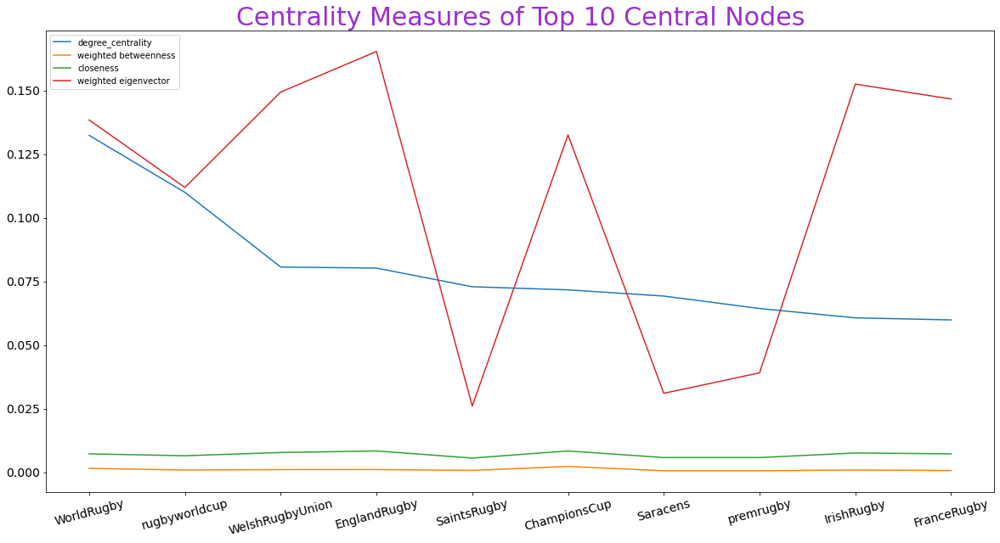

In [914]:
#Line graph using matplotlib
plt.figure(figsize=(20,10))
plt.plot(g3_measurements)
plt.title("Centrality Measures of Top 10 Central Nodes", fontsize=30, color="darkorchid")
plt.xticks(rotation=15, fontsize=14)
plt.yticks(fontsize=14)
plt.gca().legend(("degree_centrality","weighted betweenness","closeness","weighted eigenvector"))
plt.show()


In [915]:
g3_measurements.corr()

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
degree_centrality,1.000000,0.319485,0.057190,0.206632
weighted betweenness,0.319485,1.000000,0.668909,0.453974
closeness,0.057190,0.668909,1.000000,0.910683
weighted eigenvector,0.206632,0.453974,0.910683,1.000000


The results of the eigen vector results versus degree centrality suggests that <b><i>WelshRugbyUnion</i></b> is mentioned much more by a closer network of Twitters than <b><i>WorldRugby</i></b> which is to be expected.

# 4. User-hashtag network
A A bipartite network of users and the hashtags that appear in their tweets

In [916]:
tuples=[]
##forming tuples of the user and a unique hashtag that theyve used.
for i, row in tweetsDF.iterrows():
    if len(row["entities"]["hashtags"]) > 0:
        for j in range(0,len(row["entities"]["hashtags"])):
            for k in row["entities"]["hashtags"][j]:
                tuples.append((row["user"]["screen_name"], "#{}".format((row["entities"]["hashtags"][j]["text"]).lower())))

In [917]:
tuples

[('FranceRugby', '#xvdefrance'),
 ('FranceRugby', '#xvdefrance'),
 ('BristolBears', '#heinekenchampionscup'),
 ('BristolBears', '#heinekenchampionscup'),
 ('BristolBears', '#convbri'),
 ('BristolBears', '#convbri'),
 ('BristolBears', '#bristolbears'),
 ('BristolBears', '#bristolbears'),
 ('Scotlandteam', '#throwbackthursday'),
 ('Scotlandteam', '#throwbackthursday'),
 ('ChampionsCup', '#heinekenchampionscup'),
 ('ChampionsCup', '#heinekenchampionscup'),
 ('Munsterrugby', '#munvhar'),
 ('Munsterrugby', '#munvhar'),
 ('Womens6Nations', '#womenssixnations'),
 ('Womens6Nations', '#womenssixnations'),
 ('IrishRugby', '#shouldertoshoulder'),
 ('IrishRugby', '#shouldertoshoulder'),
 ('IrishRugby', '#teamofus'),
 ('IrishRugby', '#teamofus'),
 ('IrishRugby', '#autumnnationscup'),
 ('IrishRugby', '#autumnnationscup'),
 ('IrishRugby', '#irevgeo'),
 ('IrishRugby', '#irevgeo'),
 ('UlsterRugby', '#ulsvmun'),
 ('UlsterRugby', '#ulsvmun'),
 ('UlsterRugby', '#guinnesspro14'),
 ('UlsterRugby', '#guinnes

In [918]:
from networkx.algorithms import bipartite

In [919]:
# Create the bipartite network
g4 = nx.Graph()
user_nodes, hashtag_nodes = set(), set()
for t in tuples:
    # we don't have the actual names, so create a dummy name
    user=t[0]
    # map to the company name
    hashtag=t[1]    
    # create the nodes, if necessary
    if not user in user_nodes:
        g4.add_node(user, bipartite=0)
        user_nodes.add(user)
    if not hashtag in hashtag_nodes:
        g4.add_node(hashtag, bipartite=1)
        hashtag_nodes.add(hashtag)    
    # create the edge 
    hashtag_nodes.add(hashtag)
    g4.add_edge( user, hashtag )
print("Created bipartite network with %d nodes and %d edges" % ( g4.number_of_nodes(), g4.number_of_edges() ) )

Created bipartite network with 1069 nodes and 1462 edges


In [920]:
#Checking if the network is bipartite
bipartite.is_bipartite(g4)

True

In [921]:
set1, set2 = bipartite.sets(g4)

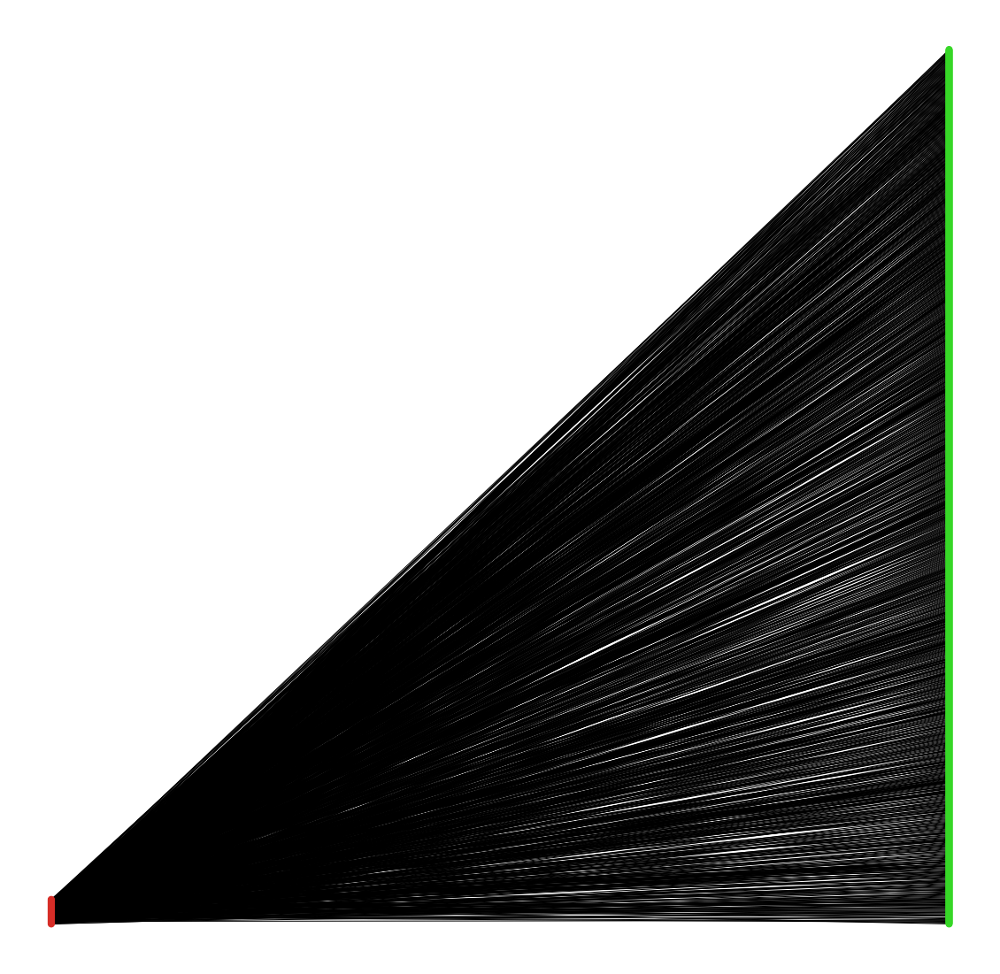

In [922]:
# Setting colurs for each part
color_map, pos = {}, {}
for i, node in enumerate(user_nodes):
    pos[node] = (0, i*10)
    color_map[node] = "#D72D27"
for i, node in enumerate(hashtag_nodes):
    pos[node] = (0.5, i*10)
    color_map[node] = "#37D727"
colors = [color_map[node] for node in g4.nodes()]

#drawing the network
plt.figure(figsize=(20,20))
nx.draw_networkx(g4, pos=pos, with_labels=False, node_size = 50,font_size = 9,node_color = colors)
plt.axis("off")
plt.show()

As expexcted, the number of hashtags is far, far greater than the number of twitter users i.e each user uses multiple hashtags. 

In [923]:
hashtag_by_degree=degrees_df(g4)
degreeData(hashtag_by_degree)
hashtag_by_degree.sort_values(ascending=False).head(10)

Degree range: [1, 218]
Mean degree: 2.74
Median degree: 1


Federugby          218
ASMOfficiel        148
FranceRugby         74
SixNationsRugby     70
StadeToulousain     70
IrishRugby          63
WorldRugby          53
Womens6Nations      51
SFParisRugby        51
racing92            50
dtype: int64

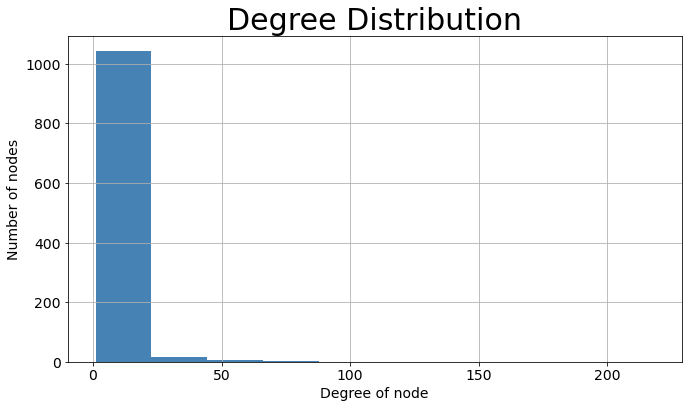

In [924]:
deghistogram(hashtag_by_degree,"Degree Distribution")

In [925]:
networkDensity(g4,"g4")
meanCluster(g4,"g4")

g4 has a network density of 0.26 %
The nodes in g4 have and average clustering coefficient of 0.0


It appears the French rugby users are the biggest fans of hashtags. Most accounts appear to use around 1 to 25 unique hashtags, but the Italian national team have used 218 unique hashtags! Out of the top 5 top “hashtaggers”, 4 of the accounts are French and Italian. This implies that hashtags are much more frequently and diversly used in France and Italy than the other European nations, which may in fact be identify a cultural contrast in twitter habits on the continent against the British Isles. There is no cluster in a bipartite network.

In [926]:
g4_measurements=centralityData(g4).head(10)
g4_measurements

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
Federugby,0.204120,0.339660,0.372255,0.665762
ASMOfficiel,0.138577,0.233152,0.327909,0.056226
FranceRugby,0.069288,0.108656,0.335322,0.074983
SixNationsRugby,0.065543,0.078602,0.340453,0.124365
StadeToulousain,0.065543,0.104066,0.325114,0.017786
IrishRugby,0.058989,0.082983,0.313656,0.058044
WorldRugby,0.049625,0.065009,0.292362,0.048319
Womens6Nations,0.047753,0.057968,0.335111,0.070658
SFParisRugby,0.047753,0.071373,0.329731,0.049190
racing92,0.046816,0.072041,0.336166,0.031858


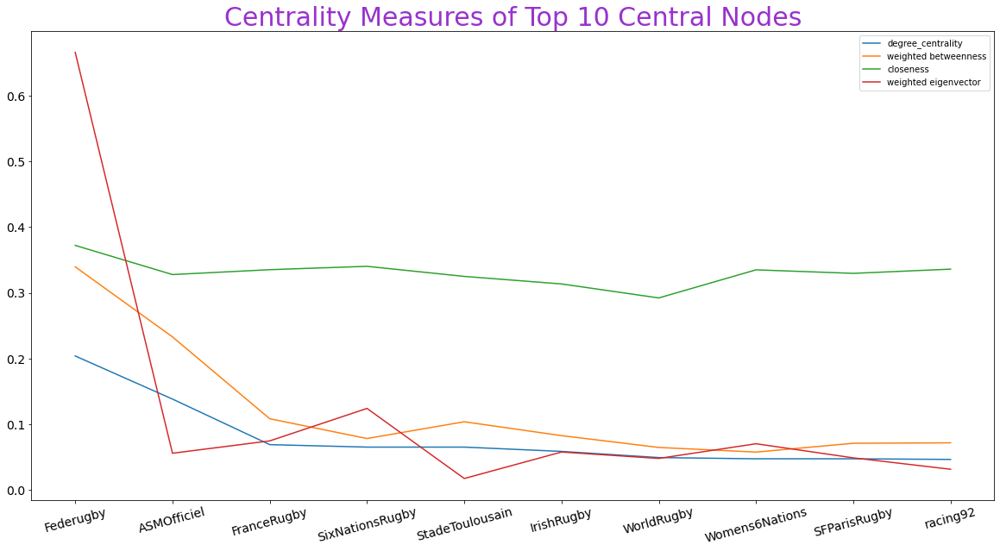

In [927]:
#Line graph using matplotlib
plt.figure(figsize=(20,10))
plt.plot(g4_measurements)
plt.title("Centrality Measures of Top 10 Central Nodes", fontsize=30, color="darkorchid")
plt.xticks(rotation=15, fontsize=14)
plt.yticks(fontsize=14)
plt.gca().legend(("degree_centrality","weighted betweenness","closeness","weighted eigenvector"))
plt.show()

In [928]:
g4_measurements.corr()

,degree_centrality,weighted betweenness,closeness,weighted eigenvector
degree_centrality,1.000000,0.995746,0.65081,0.846600
weighted betweenness,0.995746,1.000000,0.63819,0.820108
closeness,0.650810,0.638190,1.00000,0.747610
weighted eigenvector,0.846600,0.820108,0.74761,1.000000


Again, we see a difference between the degrees and the eigenvector centralities. This is more than likely caused by the French Twitter accounts addressing the same issues that require the same hashtags. Moreover, the Italians may be hash tagging in Italian, a language not used by the vast majority of other users.

# 5. Hashtag co-occurrence network

In [929]:
hashtags_by_user={}
##creating an ideed dictionary where the values are all co-appearing hashtags in a list.
for i, row in tweetsDF.iterrows():
    if len(row["entities"]["hashtags"]) > 0:
        temp=[]
        for j in range(0,len(row["entities"]["hashtags"])):
            temp.append("#{}".format((row["entities"]["hashtags"][j]["text"]).lower()))
            
        hashtags_by_user[row["id"]]=temp                 

In [930]:
hashtags_by_user

{1353685610767257600: ['#xvdefrance'],
 1340750745562439681: ['#heinekenchampionscup', '#convbri', '#bristolbears'],
 1337102279766261766: ['#throwbackthursday'],
 1337861215188623360: ['#heinekenchampionscup'],
 1338180422942003201: ['#munvhar'],
 1231629819617693698: ['#womenssixnations'],
 1333060806221721601: ['#shouldertoshoulder',
  '#teamofus',
  '#autumnnationscup',
  '#irevgeo'],
 1345444719258644482: ['#ulsvmun', '#guinnesspro14', '#suftumlive'],
 1345369980632784896: ['#gallagherprem', '#wasvexe'],
 1345410528018108418: ['#mhrst'],
 1341093730158317570: ['#mhrsfp'],
 1230174197109972992: ['#womenssixnations'],
 1337751631887282176: ['#brivasm', '#yellowarmy'],
 1336276841016025088: ['#worldrugbyawards', '#xvdefrance', '#nefaisonsxv'],
 1347651724073381890: ['#leivuls', '#guinnesspro14', '#suftumlive'],
 1353067397708570624: ['#munvlei'],
 1346934753203687424: ['#guinnesspro14', '#suftum'],
 1353654082746126337: ['#icare', '#wecare', '#strongertogether'],
 1352266636586348544

In [931]:
# create an undirected network
import itertools
g5 = nx.Graph()
for htag in hashtags_by_user:
    # get all unique pairs of individuals from this meeting
    for pair in itertools.combinations(hashtags_by_user[htag], r=2):
        # do we have the edge already? if so, increment the weight on the edge
        if g5.has_edge(pair[0], pair[1]):
            g5[pair[0]][pair[1]]["weight"] += 1
        # otherwise create a new edge with a weight of 1
        else:
            g5.add_edge(pair[0], pair[1], weight=1)

In [932]:
# iterate over the edges to get the weights
from collections import Counter
weights = Counter()
for e in g5.edges(data=True):
    # create a string from the 2 node names to use as a key
    key = "%s, %s" % (e[0], e[1])
    weights[key] = e[2]["weight"]
# by using a Python Counter variable, we can easily get the edges with highest weights
weights.most_common()

[('#shouldertoshoulder, #teamofus', 254),
 ('#xvdefrance, #nefaisonsxv', 209),
 ('#shouldertoshoulder, #irishrugby', 203),
 ('#shouldertoshoulder, #autumnnationscup', 195),
 ('#teamofus, #autumnnationscup', 190),
 ('#shouldertoshoulder, #guinnessseries', 172),
 ('#autumnnationscup, #guinnessseries', 166),
 ('#teamofus, #guinnessseries', 164),
 ('#guinnesspro14, #munvlei', 163),
 ('#teamofus, #irishrugby', 156),
 ('#guinnesspro14, #leivuls', 148),
 ('#insieme, #rugbypassioneitaliana', 134),
 ('#guinnesspro14, #leivcon', 127),
 ('#guinnesspro14, #suftumlive', 112),
 ('#autumnnationscup, #irishrugby', 101),
 ('#guinnessseries, #irishrugby', 101),
 ('#guinnesspro14, #convuls', 84),
 ('#guinnesspro14, #convmun', 82),
 ('#rugbypassioneitaliana, #peronitop10', 75),
 ('#insieme, #italrugby', 74),
 ('#bristolbears, #brivnew', 72),
 ('#bristolbears, #harvbri', 72),
 ('#autumnnationscup, #engvire', 72),
 ('#coyq, #harvlir', 71),
 ('#ulsvmun, #guinnesspro14', 68),
 ('#guinnesspro14, #convosp', 64)

In [933]:
networkSizes(g5)

Number of nodes: 855
Number of edges: 2070


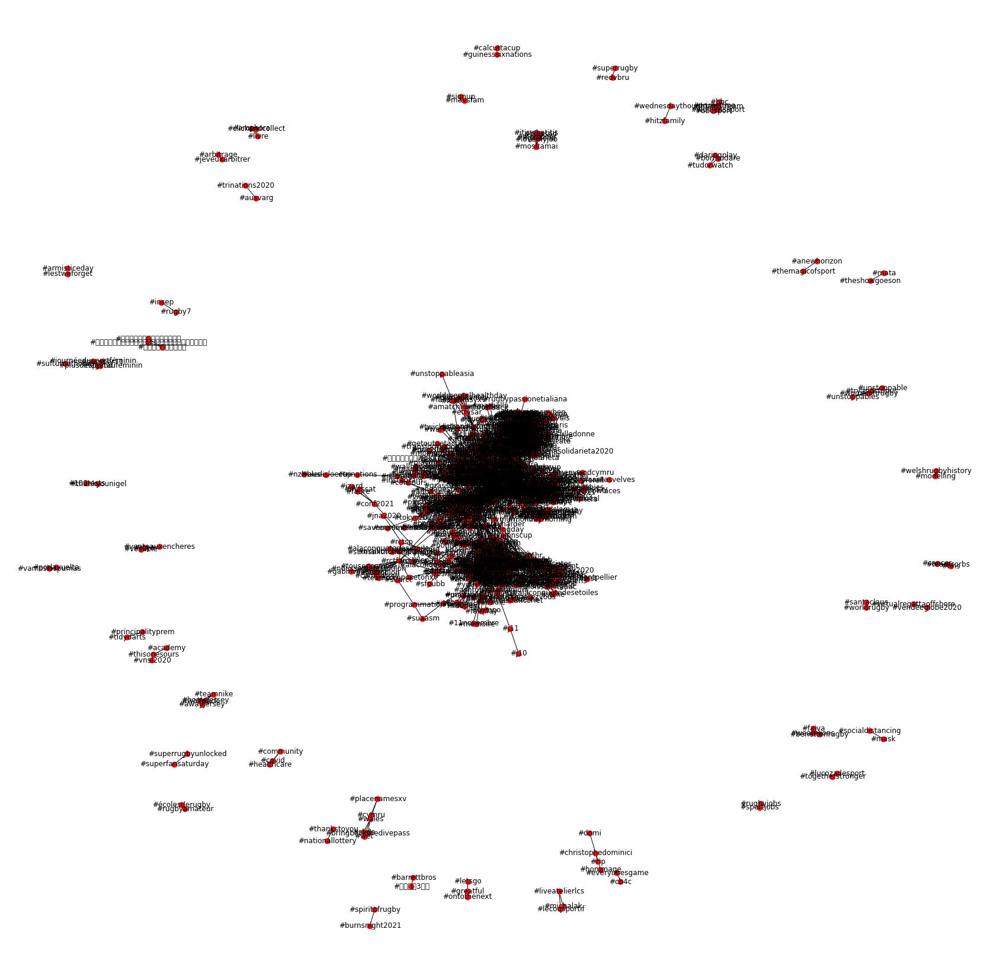

In [942]:
##laying out a networkx cooccurance graph for display
plt.figure(figsize=(30,30))
nx.draw_networkx(g5,with_labels=True, node_size=80, node_color="#F11111")
labels = nx.get_edge_attributes(g5, 'weight')
plt.axis("off");

In [935]:
networkDensity(g5,"g5")
meanCluster(g5,"g5")

g5 has a network density of 0.57 %
The nodes in g5 have and average clustering coefficient of 0.51


In [936]:
ego_node5 = "#shouldertoshoulder"
eg5 = nx.ego_graph(g5, ego_node5)

Number of nodes: 38
Number of edges: 126


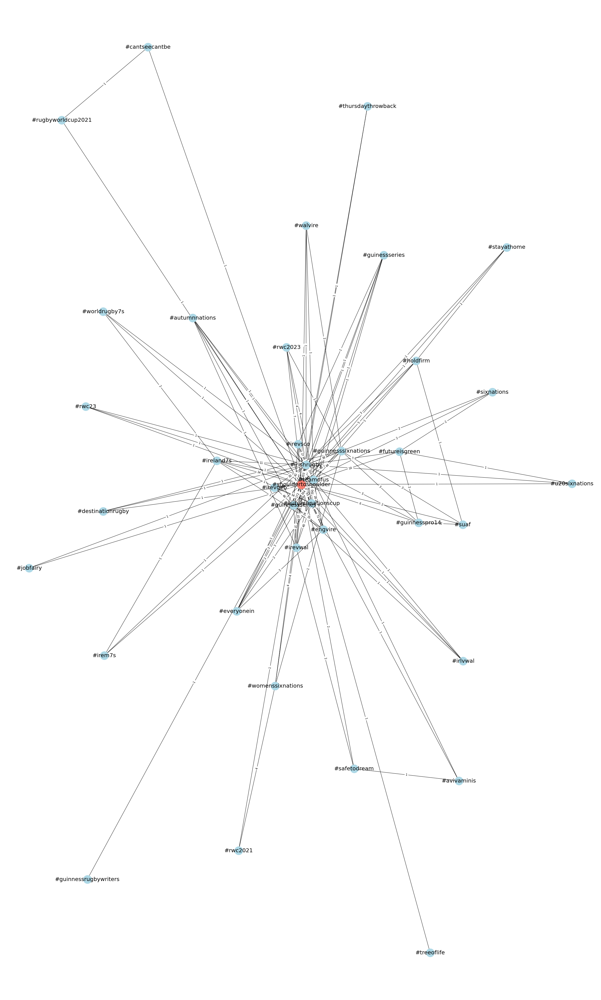

In [937]:
plt.figure(figsize=(30,50)) 

# apply layout algorithm to calculate node positions
pos = nx.spring_layout( eg5 )
# draw the nodes and edges
nx.draw(eg5, pos, with_labels = True, node_size=900, font_size=20, node_color="lightblue")
# draw the ego in red, with larger node size
nx.draw_networkx_nodes(eg5, pos, nodelist=[ego_node5], node_size=1000, node_color="#FA8072")
# now add the edge weights as labels
labels = nx.get_edge_attributes(eg5, 'weight')
nx.draw_networkx_edge_labels(eg5, pos,edge_labels=labels);
networkSizes(eg5)

In [938]:
##creating tuples of the two most occurring hashtags and the number of times they appear
temp=weights.most_common()
g5edges=temp[:10]
g5edges

[('#shouldertoshoulder, #teamofus', 254),
 ('#xvdefrance, #nefaisonsxv', 209),
 ('#shouldertoshoulder, #irishrugby', 203),
 ('#shouldertoshoulder, #autumnnationscup', 195),
 ('#teamofus, #autumnnationscup', 190),
 ('#shouldertoshoulder, #guinnessseries', 172),
 ('#autumnnationscup, #guinnessseries', 166),
 ('#teamofus, #guinnessseries', 164),
 ('#guinnesspro14, #munvlei', 163),
 ('#teamofus, #irishrugby', 156)]

In [939]:
g5edges[0][1]

254

In [940]:
##Seperating the tuples into seperate lists for display
edgeName=[]
occurances=[]
for i in range(len(g5edges)):
    edgeName.append(g5edges[i][0])
    occurances.append(g5edges[i][1])

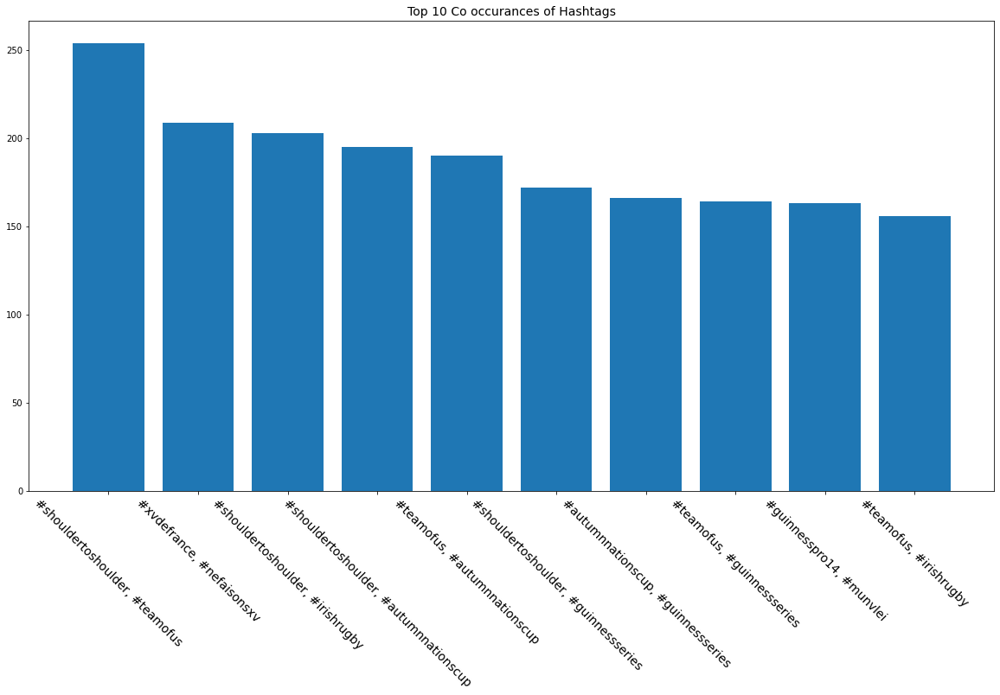

In [941]:
plt.figure(figsize=(20,10))
# set up the plot
titleG5="Top 10 Co occurances of Hashtags"
plt.title(titleG5, fontsize=14)
plt.xticks(rotation=315, fontsize=14)
plt.bar(edgeName,occurances);

<b><i>#shouldertoshoulder </i></b> and <b><i>#shouldertoshoulder </i>#teamofus</b> appear the most together out of all the hashtags in the network. It seems this must be a staple of the Irish Rugby Teams hashtags on Twitter as <b><i>#shouldertoshoulder </i></b> is prevalent in the most commonly occurring hashtag pairs as seen in the visualizations above. <b><i>g5 </i></b> is actually a very dense network despite being composed of many, many components. This and the sketch of the graph portray lots of obvious cluster within the graph. This is confirmed by the high cluster coefficient of 51%.

When we create the <b><i>ego-network</i></b> with <b><i>#shouldertoshoulder </i></b> we observe its use in various combinations with 37 other unique hashtags. The wide variety and diversity of its neighbouring hashtags entails that it, along with </i>#teamofus</b> are benchmark hashtags for the majority of Irish Rugby’s Tweets.
